# Omnipose segmentation
Runs `bact_phase_omni` on phase images and opens results in napari.

**Kernel:** activate the `omnipose` conda env before launching Jupyter:
```
conda activate omnipose
jupyter notebook
```

In [ ]:
from pathlib import Path

# ── USER SETTINGS ────────────────────────────────────────────────────────────
_base      = Path.home() / "Box/Zohar_Persky/projects/p2f-revisions/morph-omnipose"
IMAGE_DIR  = _base / "phase-proj"
OUTPUT_DIR = _base / "omnipose_seg"

# glob pattern — change to "*.phase.tif" to process all at once
PATTERN     = "*.phase.tif"  #"fov_1_hyb_1.phase.tif"

MODEL_TYPE  = "bact_phase_omni"   # or bact_fluor_omni, cyto2_omni, …
DIAMETER    = 0                   # 0 = auto-estimate
USE_GPU     = False               # set True if you have a CUDA GPU

IS_OVERWRITE = False              # False = skip FOVs already in OUTPUT_DIR; True = re-run all

NAPARI_FOV  = 0                   # 0-based index of the FOV to open in napari
# ─────────────────────────────────────────────────────────────────────────────

In [ ]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

import numpy as np
import tifffile
from cellpose_omni import models
import omnipose

print(f"omnipose {omnipose.__version__}")

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

image_paths = sorted(IMAGE_DIR.glob(PATTERN))
print(f"Found {len(image_paths)} image(s)")

In [5]:
print(f"Loading model: {MODEL_TYPE}")
model = models.CellposeModel(gpu=USE_GPU, model_type=MODEL_TYPE)

Loading model: bact_phase_omni
2026-06-24 13:46:13,282	[INFO]     cellpose_omni\models.py       __init__....()	 line 440	>>bact_phase_omni<< model set to be used
2026-06-24 13:46:13,285	[INFO]     omnipose\gpu.py               _get...torch()	 line  64	TORCH GPU version not installed/working.
2026-06-24 13:46:13,285	[INFO]     cellpose_omni\core.py         assi...evice()	 line 118	Using CPU.
2026-06-24 13:46:13,357	[INFO]                                   __init__....()	 line 218	u-net config: ([2, 32, 64, 128, 256], 4, 2)


In [ ]:
results = []   # list of (path, img, mask) for napari

for path in image_paths:
    print(f"\nProcessing: {path.name}")
    out_path = OUTPUT_DIR / (path.stem + "_masks.tif")

    if not IS_OVERWRITE and out_path.exists():
        print(f"  → skipping (already segmented): {out_path.name}")
        img  = tifffile.imread(path)
        mask = tifffile.imread(out_path)
        results.append((path.name, img, mask))
        continue

    img = tifffile.imread(path)
    print(f"  shape={img.shape}  dtype={img.dtype}  min={img.min()}  max={img.max()}")

    # normalise to float32 [0, 1]
    img_f = img.astype(np.float32)
    img_f = (img_f - img_f.min()) / (img_f.max() - img_f.min())

    masks, flows, styles = model.eval(
        [img_f],
        diameter=DIAMETER,
        channels=[0, 0],
        omni=True,
        cluster=True,
        resample=True,
        verbose=True,
    )
    mask = masks[0]
    n_cells = mask.max()
    print(f"  → {n_cells} cells detected")

    tifffile.imwrite(out_path, mask.astype(np.uint16))
    print(f"  → mask saved: {out_path}")

    results.append((path.name, img, mask))

print("\nAll done.")

In [ ]:
# ── Save old-format outputs (.seg.npy, .props.txt, .phase_per_cell.txt, .seg_image.tif) ──
import pandas as pd
from skimage.measure import regionprops
from skimage.measure import perimeter as sk_perimeter


def _get_region_props(seg_mask):
    cell_props = regionprops(seg_mask)
    prop_names = ['label', 'area', 'perimeter', 'eccentricity',
                  'major_axis_length', 'minor_axis_length', 'centroid',
                  'orientation', 'solidity', 'convex_area']
    data = []
    for prop in cell_props:
        cell_data = {p: getattr(prop, p) for p in prop_names}
        convex_perim = sk_perimeter(
            np.pad(prop.convex_image, 1, mode='constant', constant_values=0)
        )
        cell_data['area_ratio']      = prop.area / prop.convex_area
        cell_data['perimeter_ratio'] = prop.perimeter / convex_perim
        data.append(cell_data)
    df = pd.DataFrame(data)
    df['perim_to_area'] = df['perimeter'] / df['area']
    df['axis_ratio']    = df['major_axis_length'] / df['minor_axis_length']
    df['circularity']   = (4 * np.pi * df['area']) / (df['perimeter'] ** 2)
    return df


def _calculate_per_cell(img, seg_mask):
    cell_ids = np.unique(seg_mask)
    cell_ids = cell_ids[cell_ids != 0]
    rows = []
    for cell_id in cell_ids:
        px   = img[seg_mask == cell_id]
        mean = float(np.mean(px))
        rows.append({
            'cell_id': cell_id,
            'total':   round(float(np.sum(px)),    1),
            'mean':    round(mean,                  1),
            'stdv':    round(float(np.std(px)),     1),
            'median':  round(float(np.median(px)), 1),
            'cv':      round(float(np.std(px) / mean) if mean != 0 else np.nan, 5),
        })
    return pd.DataFrame(rows)


for name, img, mask in results:
    # fov_1_hyb_1.phase.tif  →  fov_1_hyb_1
    base    = Path(name).with_suffix('').with_suffix('').name
    fov_dir = OUTPUT_DIR / base

    if not IS_OVERWRITE and fov_dir.exists():
        print(f"Skipping {base}: output already exists")
        continue

    fov_dir.mkdir(parents=True, exist_ok=True)

    # .seg.unfilt.npy — raw model output before any filtering
    np.save(fov_dir / f"{base}.seg.unfilt.npy", mask)

    # .seg.npy — labeled mask (same as unfilt until downstream filtering is applied)
    np.save(fov_dir / f"{base}.seg.npy", mask)

    # .props.txt — morphological properties per cell
    props_df = _get_region_props(mask)
    props_df.to_csv(fov_dir / f"{base}.props.txt", sep='\t', index=False)

    # .phase_per_cell.txt — phase intensity stats per cell
    phase_df = _calculate_per_cell(img, mask)
    phase_df.to_csv(fov_dir / f"{base}.phase_per_cell.txt", sep='\t', index=False)

    # .seg_image.tif — segmentation input image as 2-D uint16
    tifffile.imwrite(fov_dir / f"{base}.seg_image.tif", img.astype(np.uint16))

    print(f"Saved {base}: {mask.max()} cells  →  {fov_dir}")

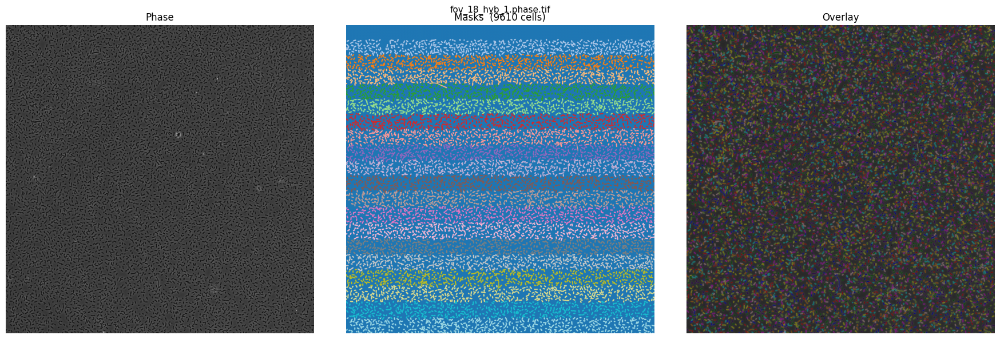

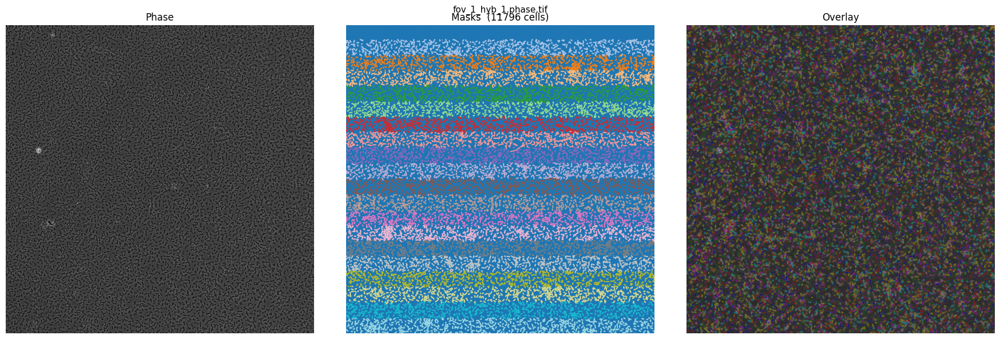

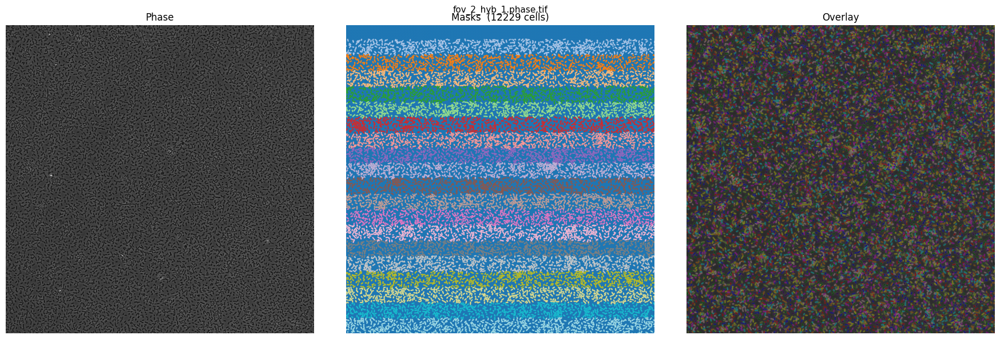

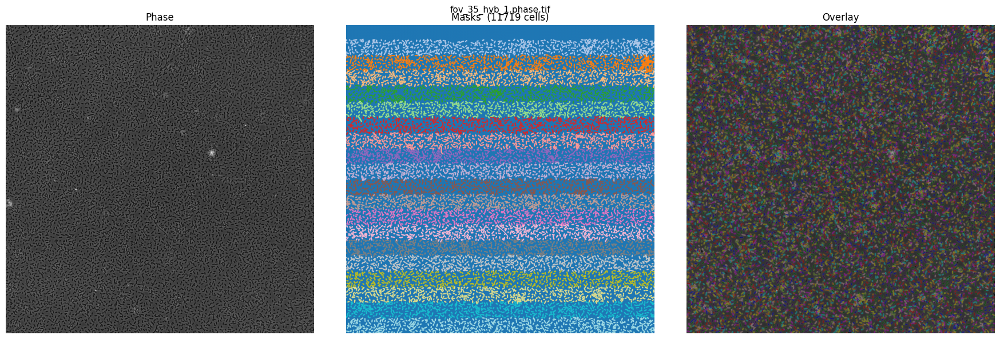

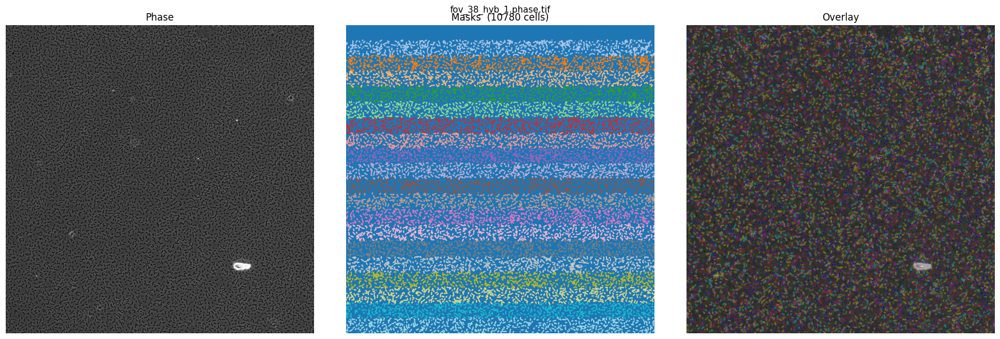

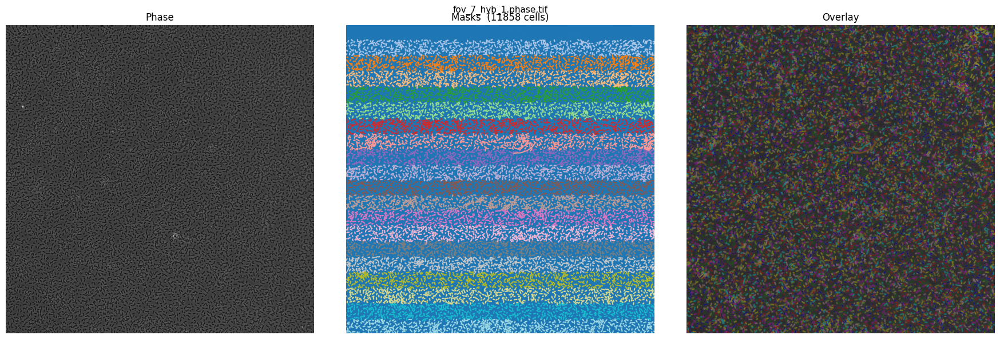

In [7]:
# ── Quick matplotlib preview (no napari needed) ───────────────────────────────
import matplotlib.pyplot as plt
from skimage.color import label2rgb

for name, img, mask in results:
    overlay = label2rgb(mask, image=img.astype(float) / img.max(), bg_label=0, alpha=0.35)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img, cmap="gray");          axes[0].set_title("Phase")
    axes[1].imshow(mask, cmap="tab20");        axes[1].set_title(f"Masks  ({mask.max()} cells)")
    axes[2].imshow(overlay);                  axes[2].set_title("Overlay")
    for ax in axes: ax.axis("off")
    fig.suptitle(name, fontsize=11)
    plt.tight_layout()
    plt.show()

In [ ]:
# ── Napari viewer (interactive) ───────────────────────────────────────────────
# Opens a single FOV in napari. Set NAPARI_FOV in the settings cell to pick which one.
import napari

name, img, mask = results[NAPARI_FOV]
print(f"Opening FOV {NAPARI_FOV}: {name}")

viewer = napari.Viewer(title=name)
viewer.add_image(img, name="phase", colormap="gray",
                 contrast_limits=[int(img.min()), int(img.max())])
viewer.add_labels(mask, name="omnipose_masks")

napari.run()   # blocks until the napari window is closed